# Transfer Learning

In [ ]:
!pip install mpl_finance

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pickle
from mpl_finance import candlestick2_ohlc
import warnings
warnings.filterwarnings('ignore')
# from tensorflow.keras.utils import to_categorical
from os import listdir
from os.path import isfile, join
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras

C:\Users\marta\anaconda3\lib\site-packages\mpl_finance.py:16: DeprecationWarning: 



    Please use `mplfinance` instead (no hyphen, no underscore).

    To install: `pip install --upgrade mplfinance` 

   For more information, see: https://pypi.org/project/mplfinance/


  __warnings.warn('\n\n  ================================================================='+


In [ ]:
def load_data_stock():
    "Loads data stock data"
    # Load data
    date = pd.read_csv('date.csv',header=None)
    aux = date.iloc[:,0].values
    validSymbols = pd.read_csv('selectedSymbols.csv', header=None)
    validCols = validSymbols.iloc[0,:].values - 1
    close_quotes = pd.read_csv('close.csv', header=None, usecols=validCols)
    open_quotes = pd.read_csv('open.csv',header=None, usecols=validCols)
    low_quotes = pd.read_csv('low.csv',header=None, usecols=validCols)
    high_quotes = pd.read_csv('high.csv',header=None, usecols=validCols)
    volume_quotes = pd.read_csv('volume.csv',header=None, usecols=validCols)
    # Rename df
    # Col names --> stock ticker names
    ticker = pd.read_csv('ticker.csv', header=None)
    valid_stock_tickers = ticker.loc[validCols, 0].values
    close_quotes.columns = valid_stock_tickers
    open_quotes.columns = valid_stock_tickers
    high_quotes.columns = valid_stock_tickers
    low_quotes.columns = valid_stock_tickers
    volume_quotes.columns = valid_stock_tickers
    # Row index --> date index
    close_quotes.index = aux
    open_quotes.index = aux
    high_quotes.index = aux
    low_quotes.index = aux
    volume_quotes.index = aux
    return close_quotes, open_quotes, high_quotes, low_quotes, volume_quotes

In [ ]:
def download_files(): 
    onlyfiles = [f for f in listdir('Data') if isfile(join('Data', f))]

    data = []

    for file_ in onlyfiles:

        # print(join('Datos', fichero))    
        df = pd.read_csv(join('Data', file_), usecols=[1,2,3,4])    
        data.append(df)

    data = pd.concat(data)
    return data

In [ ]:
data = download_files()
data

In [ ]:
close_quotes, open_quotes, high_quotes, low_quotes, volume_quotes = load_data_stock()

In [ ]:
close_quotes.head(10)

In [ ]:
def get_hist_window(hist, idx_date, idx_stock, window_size):
    return hist.iloc[idx_date:idx_date+window_size, idx_stock]

In [ ]:
def get_df_sample(data, close_quotes, open_quotes, high_quotes, low_quotes, volume_quotes, sample):
    window_size = 40
    idx_stock = data.Ticker.iloc[sample]
    idx_date = data.DateIndex.iloc[sample]
    open_df = get_hist_window(open_quotes, idx_date, idx_stock, window_size)
    close_df = get_hist_window(close_quotes, idx_date, idx_stock, window_size)
    high_df = get_hist_window(high_quotes, idx_date, idx_stock, window_size)
    low_df = get_hist_window(low_quotes, idx_date, idx_stock, window_size)
    volume_df = get_hist_window(volume_quotes, idx_date, idx_stock, window_size)
    df = pd.concat([open_df, close_df, high_df, low_df, volume_df], axis=1)
    df.columns = ['open_price', 'close_price', 'high', 'low', 'volume']
    df.index = pd.to_datetime(pd.to_datetime(df.index), format='%d-%m-%Y')
    return df
    

Generate data

In [ ]:
df = get_df_sample(data, close_quotes, open_quotes, high_quotes, low_quotes, volume_quotes, 0)

In [ ]:
df

In [ ]:
from PIL import Image, ImageChops

fig2save, ax = plt.subplots(figsize=(6,4))
_ = candlestick2_ohlc(ax, df.open_price, df.high,
                             df.low , df.close_price,
                             colorup='g', colordown='r', width=0.66, alpha=1)
_ = plt.axis('off')


In [ ]:
def fig2img(fig):
    """Convert a Matplotlib figure to a PIL Image and return it"""
    import io
    buf = io.BytesIO()
    fig.savefig(buf)
    buf.seek(0)
    img = Image.open(buf)
    return img

In [ ]:
for i in range(data.shape[0]):
    df = get_df_sample(data, close_quotes, open_quotes, high_quotes, low_quotes, volume_quotes, i)
    fig2save, ax = plt.subplots(figsize=(6,4))
    _ = candlestick2_ohlc(ax, df.open_price, df.high,
                                df.low , df.close_price,
                                colorup='g', colordown='r', width=0.66, alpha=1)
    _ = plt.axis('off')
    if data.Label.iloc[i] == 1:
        filename = "True/ej_%i.jpg"%i
        fig2save.savefig(filename)
    else:
        filename = "False/ej_%i.jpg"%i
        fig2save.savefig(filename)


In [ ]:
# Center images

In [ ]:
def trim(im):
    bg = Image.new(im.mode, im.size, im.getpixel((0,0)))
    diff = ImageChops.difference(im, bg)
    diff = ImageChops.add(diff, diff, 2.0, -100)
    bbox = diff.getbbox()
    if bbox:
        return im.crop(bbox)

In [ ]:
def trimFiles(label): 
  i = 0
  if label == 1:
    dir = 'True'
    onlyfiles = [f for f in listdir(dir) if isfile(join(dir, f))]
    len(onlyfiles)
    for file_ in onlyfiles:
        image = Image.open(join(dir, file_))
        image = trim(image)
        filename = "True_truncated/ej_%i.jpg"%i
        image.save(filename)
        i += 1
  else:
    dir = 'False'
    onlyfiles = [f for f in listdir(dir) if isfile(join(dir, f))]
    len(onlyfiles)
    for file_ in onlyfiles:
        image = Image.open(join(dir, file_))
        image = trim(image)
        filename = "False_truncated/ej_%i.jpg"%i
        image.save(filename)
        i += 1

In [ ]:
trimFiles(1)
trimFiles(0)

Convert images to numpy arrays

In [ ]:
from PIL import Image
import numpy as np

In [ ]:
# Try one example to get dimensions
onlyfiles = [f for f in listdir('True_truncated') if isfile(join('True_truncated', f))]
dir = 'True_truncated/' + onlyfiles[0]
image = Image.open(dir)
image = image.resize((230, 230), Image.BILINEAR) 
image_array = np.array(image)
sizes = image_array.shape
sizes

In [ ]:
def convert_images2array(dir): 
    onlyfiles = [f for f in listdir(dir) if isfile(join(dir, f))]
    len(onlyfiles)
    data = []
    for file_ in onlyfiles:
        image = Image.open(join(dir, file_))
        image = image.resize((230, 230), Image.BILINEAR) 
        image_array = np.array(image)
        data.append(image_array)
    return np.array(data)

In [ ]:
x_true = convert_images2array('True_truncated')

In [ ]:
x_false = convert_images2array('False_truncated')

In [ ]:
# Add label
y = np.zeros((len(x_true)+len(x_false),1))
y[0:len(x_true)] = 1.
X = np.vstack([x_true, x_false])
print('X shape:',X.shape)
print('y shape:',y.shape)

In [ ]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical

In [ ]:
# Train test split
x_train, x_test, y_train, y_test = train_test_split(X,y, stratify=y)
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

In [ ]:
# from collections import Counter
# Counter(y_train)

In [2]:
import pickle

In [ ]:
# x_train
f = open('x_train.pckl', 'wb')
pickle.dump(x_train, f)
f.close()
# x_test
f = open('x_test.pckl', 'wb')
pickle.dump(x_test, f)
f.close()
# y_train
f = open('y_train.pckl', 'wb')
pickle.dump(y_train, f)
f.close()
# y_test
f = open('y_test.pckl', 'wb')
pickle.dump(y_test, f)
f.close()

In [3]:
f = open('y_train.pckl', 'rb')
y_train = pickle.load(f)
f.close()

f = open('y_test.pckl', 'rb')
y_test = pickle.load(f)
f.close()

f = open('x_train.pckl', 'rb')
x_train = pickle.load(f)
f.close()

f = open('x_test.pckl', 'rb')
x_test = pickle.load(f)
f.close()

Transfer learning

In [4]:
from tensorflow.keras import layers, models, Model, losses

In [5]:
from tensorflow.keras.applications import ResNet152 
from tensorflow import keras

In [7]:
sizes = x_train[0].shape
sizes

(230, 230, 3)

In [15]:
base_model = ResNet152(weights='imagenet', include_top=False, input_shape=sizes, classes=2)

In [16]:
base_model = ResNet152(weights='imagenet', include_top=False, input_shape=sizes, classes=2)
for layer in base_model.layers:
  layer.trainable = False


In [17]:
x = layers.Flatten()(base_model.output)
x = layers.Dense(10, activation='relu')(x)
# x = layers.Dropout(0.3)(x)
# x = layers.Dense(10, activation='relu')(x)
predictions = layers.Dense(2, activation = 'softmax')(x)

In [18]:
head_model = Model(inputs = base_model.input, outputs = predictions)
# head_model.compile(optimizer='adam', loss=losses.sparse_categorical_crossentropy, metrics=[keras.metrics.get('Precision')])
head_model.compile(optimizer='adam', loss=losses.categorical_crossentropy, metrics=['accuracy'])

In [12]:
from tensorflow.keras.utils import plot_model

In [ ]:
plot_model(head_model)

In [ ]:
head_model.summary()

In [19]:
x_train = x_train/255.0
x_test = x_test/255.0

In [20]:
history = head_model.fit(x_train, y_train, batch_size=128, epochs=100, validation_data=(x_test, y_test))

Train on 3845 samples, validate on 1282 samples
Epoch 1/100
3845/3845 [==============================] - 61s 16ms/sample - loss: 1.1333 - accuracy: 0.8343 - val_loss: 0.4517 - val_accuracy: 0.8627
Epoch 2/100
3845/3845 [==============================] - 38s 10ms/sample - loss: 0.2864 - accuracy: 0.8629 - val_loss: 0.4087 - val_accuracy: 0.8627
Epoch 3/100
3845/3845 [==============================] - 38s 10ms/sample - loss: 0.2127 - accuracy: 0.8632 - val_loss: 0.4230 - val_accuracy: 0.8627
Epoch 4/100
3845/3845 [==============================] - 43s 11ms/sample - loss: 0.1647 - accuracy: 0.8635 - val_loss: 0.6800 - val_accuracy: 0.8627
Epoch 5/100
3845/3845 [==============================] - 39s 10ms/sample - loss: 0.1598 - accuracy: 0.8848 - val_loss: 0.6089 - val_accuracy: 0.8627
Epoch 6/100
3845/3845 [==============================] - 43s 11ms/sample - loss: 0.1256 - accuracy: 0.9628 - val_loss: 0.7343 - val_accuracy: 0.8627
Epoch 7/100
3845/3845 [==============================] - 4

KeyboardInterrupt: 

In [ ]:
# Guardar el modelo
head_model.save('transfer_learning_model.h5')

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
fig, axs = plt.subplots(2, 1, figsize=(15,15))
axs[0].plot(history.history['loss'])
axs[0].plot(history.history['val_loss'])
axs[0].title.set_text('Training Loss vs Validation Loss')
axs[0].set_xlabel('Epochs')
axs[0].set_ylabel('Loss')
axs[0].legend(['Train','Val'])
axs[1].plot(history.history['accuracy'])
axs[1].plot(history.history['val_accuracy'])
axs[1].title.set_text('Training Precision vs Validation Precision')
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('Precision')
axs[1].legend(['Train', 'Val'])

In [ ]:
def make_confusion_matrix(cf,
                          group_names=None,
                          categories='auto',
                          count=True,
                          percent=True,
                          cbar=True,
                          xyticks=True,
                          xyplotlabels=True,
                          sum_stats=True,
                          figsize=None,
                          cmap='Blues',
                          title=None):
    '''
    This function will make a pretty plot of an sklearn Confusion Matrix cm using a Seaborn heatmap visualization.
    Arguments
    ---------
    cf:            confusion matrix to be passed in
    group_names:   List of strings that represent the labels row by row to be shown in each square.
    categories:    List of strings containing the categories to be displayed on the x,y axis. Default is 'auto'
    count:         If True, show the raw number in the confusion matrix. Default is True.
    normalize:     If True, show the proportions for each category. Default is True.
    cbar:          If True, show the color bar. The cbar values are based off the values in the confusion matrix.
                   Default is True.
    xyticks:       If True, show x and y ticks. Default is True.
    xyplotlabels:  If True, show 'True Label' and 'Predicted Label' on the figure. Default is True.
    sum_stats:     If True, display summary statistics below the figure. Default is True.
    figsize:       Tuple representing the figure size. Default will be the matplotlib rcParams value.
    cmap:          Colormap of the values displayed from matplotlib.pyplot.cm. Default is 'Blues'
                   See http://matplotlib.org/examples/color/colormaps_reference.html
                   
    title:         Title for the heatmap. Default is None.
    '''


    # CODE TO GENERATE TEXT INSIDE EACH SQUARE
    blanks = ['' for i in range(cf.size)]

    if group_names and len(group_names)==cf.size:
        group_labels = ["{}\n".format(value) for value in group_names]
    else:
        group_labels = blanks

    if count:
        group_counts = ["{0:0.0f}\n".format(value) for value in cf.flatten()]
    else:
        group_counts = blanks

    if percent:
        group_percentages = ["{0:.2%}".format(value) for value in cf.flatten()/np.sum(cf)]
    else:
        group_percentages = blanks

    box_labels = [f"{v1}{v2}{v3}".strip() for v1, v2, v3 in zip(group_labels,group_counts,group_percentages)]
    box_labels = np.asarray(box_labels).reshape(cf.shape[0],cf.shape[1])


    # CODE TO GENERATE SUMMARY STATISTICS & TEXT FOR SUMMARY STATS
    if sum_stats:
        #Accuracy is sum of diagonal divided by total observations
        accuracy  = np.trace(cf) / float(np.sum(cf))

        #if it is a binary confusion matrix, show some more stats
        if len(cf)==2:
            #Metrics for Binary Confusion Matrices
            precision = cf[1,1] / sum(cf[:,1])
            recall    = cf[1,1] / sum(cf[1,:])
            f1_score  = 2*precision*recall / (precision + recall)
            stats_text = "\n\nAccuracy={:0.3f}\nPrecision={:0.3f}\nRecall={:0.3f}\nF1 Score={:0.3f}".format(
                accuracy,precision,recall,f1_score)
        else:
            stats_text = "\n\nAccuracy={:0.3f}".format(accuracy)
    else:
        stats_text = ""


    # SET FIGURE PARAMETERS ACCORDING TO OTHER ARGUMENTS
    if figsize==None:
        #Get default figure size if not set
        figsize = plt.rcParams.get('figure.figsize')

    if xyticks==False:
        #Do not show categories if xyticks is False
        categories=False


    # MAKE THE HEATMAP VISUALIZATION
    plt.figure(figsize=figsize)
    sns.heatmap(cf,annot=box_labels,fmt="",cmap=cmap,cbar=cbar,xticklabels=categories,yticklabels=categories)

    if xyplotlabels:
        plt.ylabel('True label')
        plt.xlabel('Predicted label' + stats_text)
    else:
        plt.xlabel(stats_text)
    
    if title:
        plt.title(title)

In [ ]:
import pandas as pd

In [ ]:
y_pred = pd.DataFrame(head_model.predict(x_test)).idxmax(axis=1).values

In [ ]:
import seaborn as sns
import numpy as np

In [ ]:
from sklearn.metrics import confusion_matrix
y_test_aux = pd.DataFrame(y_test).idxmax(axis=1).values
cf_matrix = confusion_matrix(y_test_aux, y_pred)
labels = ['True Neg','False Pos','False Neg','True Pos']
categories = ['0', '1']
make_confusion_matrix(cf_matrix, 
                      group_names=labels,
                      categories=categories)

In [ ]:
model = keras.models.load_model('transfer_learning_model.h5')

In [ ]:
from sklearn import metrics

In [ ]:
auc = metrics.roc_auc_score(y_test_aux, y_pred)
fpr, tpr, _ = metrics.roc_curve(y_test_aux,  y_pred)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

# Algoritmo de Self-Training

In [2]:
 # importamos el modelo guardado anteriormente
 model = tf.keras.models.load_model('transfer_learning_model.h5')

In [3]:
# Datos iniciales
f = open('y_train.pckl', 'rb')
y_train = pickle.load(f)
f.close()

f = open('y_test.pckl', 'rb')
y_test = pickle.load(f)
f.close()

f = open('x_train.pckl', 'rb')
x_train = pickle.load(f)
f.close()

f = open('x_test.pckl', 'rb')
x_test = pickle.load(f)
f.close()

In [7]:
tf.test.gpu_device_name()

''

In [8]:
def load_data_stock():
    "Loads data stock data"
    # Load data
    date = pd.read_csv('date.csv',header=None)
    aux = date.iloc[:,0].values
    validSymbols = pd.read_csv('selectedSymbols.csv', header=None)
    validCols = validSymbols.iloc[0,:].values - 1
    close_quotes = pd.read_csv('close.csv', header=None, usecols=validCols)
    open_quotes = pd.read_csv('open.csv',header=None, usecols=validCols)
    low_quotes = pd.read_csv('low.csv',header=None, usecols=validCols)
    high_quotes = pd.read_csv('high.csv',header=None, usecols=validCols)
    volume_quotes = pd.read_csv('volume.csv',header=None, usecols=validCols)
    # Rename df
    # Col names --> stock ticker names
    ticker = pd.read_csv('ticker.csv', header=None)
    valid_stock_tickers = ticker.loc[validCols, 0].values
    close_quotes.columns = valid_stock_tickers
    open_quotes.columns = valid_stock_tickers
    high_quotes.columns = valid_stock_tickers
    low_quotes.columns = valid_stock_tickers
    volume_quotes.columns = valid_stock_tickers
    # Row index --> date index
    close_quotes.index = aux
    open_quotes.index = aux
    high_quotes.index = aux
    low_quotes.index = aux
    volume_quotes.index = aux
    return close_quotes, open_quotes, high_quotes, low_quotes, volume_quotes

In [9]:
close_quotes, open_quotes, high_quotes, low_quotes, volume_quotes = load_data_stock()

In [10]:
# Generate unlabeled data
n_samples = 10000
data_unlabeled = pd.DataFrame(columns=['Ticker', 'DateIndex'])

In [11]:
data_unlabeled.Ticker = np.random.randint(low=0, high=close_quotes.shape[1], size=(n_samples,))
data_unlabeled.DateIndex = np.random.randint(low=0, high=close_quotes.shape[0], size=(n_samples,))

In [12]:
data_unlabeled.head(10)

,Ticker,DateIndex
0,2314,782
1,1274,778
2,1429,84
3,151,1056
4,386,236
5,552,1795
6,66,707
7,875,2220
8,710,125
9,1202,1653


In [13]:
def get_hist_window(hist, idx_date, idx_stock, window_size):
    return hist.iloc[idx_date:idx_date+window_size, idx_stock]

In [14]:
def get_df_sample(data, close_quotes, open_quotes, high_quotes, low_quotes, volume_quotes, sample):
    window_size = 40
    idx_stock = data.Ticker.iloc[sample]
    idx_date = data.DateIndex.iloc[sample]
    open_df = get_hist_window(open_quotes, idx_date, idx_stock, window_size)
    close_df = get_hist_window(close_quotes, idx_date, idx_stock, window_size)
    high_df = get_hist_window(high_quotes, idx_date, idx_stock, window_size)
    low_df = get_hist_window(low_quotes, idx_date, idx_stock, window_size)
    volume_df = get_hist_window(volume_quotes, idx_date, idx_stock, window_size)
    df = pd.concat([open_df, close_df, high_df, low_df, volume_df], axis=1)
    df.columns = ['open_price', 'close_price', 'high', 'low', 'volume']
    df.index = pd.to_datetime(pd.to_datetime(df.index), format='%d-%m-%Y')
    return df
    

In [15]:
import regex as re

In [18]:
# For avoid RAM problems
dir = "Unlabeled"
onlyfiles = [f for f in listdir(dir) if isfile(join(dir, f))]
if len(onlyfiles)>0:
    idx_start = onlyfiles[-1]
    idx_start = int(re.findall('[0-9]+', idx_start)[0]) + 1
else:
    idx_start = 0

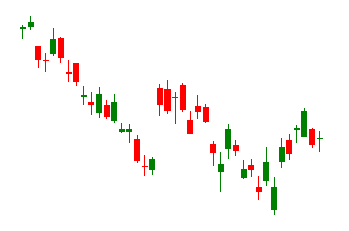

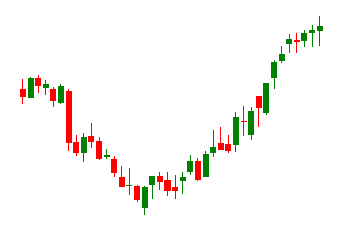

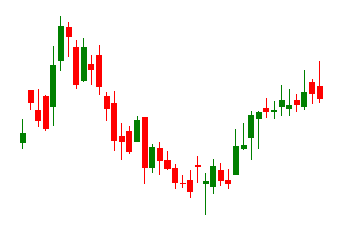

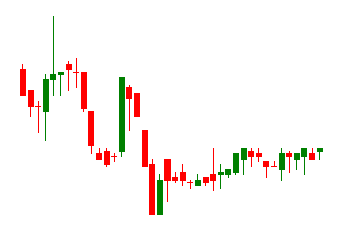

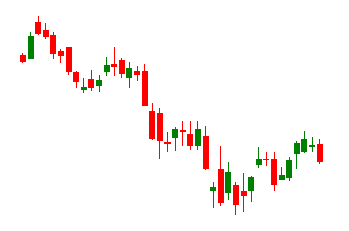

...

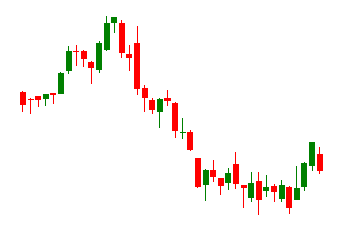

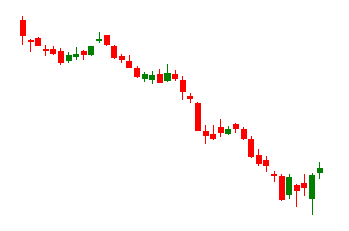

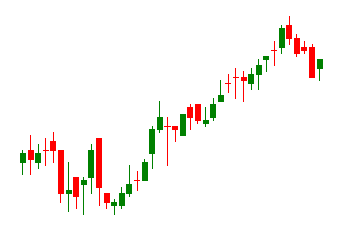

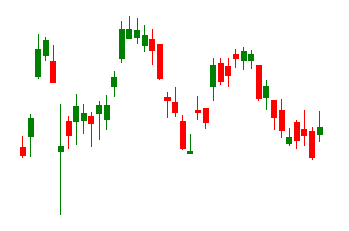

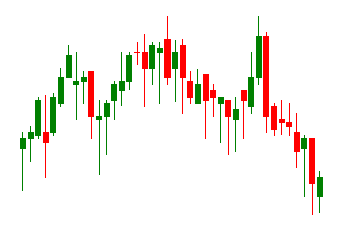

In [20]:
for i in range(data_unlabeled.shape[0]):
    j = idx_start
    df = get_df_sample(data_unlabeled, close_quotes, open_quotes, high_quotes, low_quotes, volume_quotes, i)
    if (df.dropna().shape ==  df.shape): # there is no NaNs
      fig2save, ax = plt.subplots(figsize=(6,4))
      _ = candlestick2_ohlc(ax, df.open_price, df.high,
                                  df.low , df.close_price,
                                  colorup='g', colordown='r', width=0.66, alpha=1)
      _ = plt.axis('off')
      filename = "Unlabeled/ej_%i.jpg"%i
      fig2save.savefig(filename)
    j +=1

In [ ]:
def trim(im):
    bg = Image.new(im.mode, im.size, im.getpixel((0,0)))
    diff = ImageChops.difference(im, bg)
    diff = ImageChops.add(diff, diff, 2.0, -100)
    bbox = diff.getbbox()
    if bbox:
        return im.crop(bbox)

In [ ]:
def trimFiles(): 
  i = 0
  dir = 'Unlabeled'
  onlyfiles = [f for f in listdir(dir) if isfile(join(dir, f))]
  len(onlyfiles)
  for file_ in onlyfiles:
      image = Image.open(join(dir, file_))
      image = trim(image)
      filename = "Unlabeled_truncated/ej_%i.jpg"%i
      image.save(filename)
      i += 1

In [ ]:
from PIL import ImageChops, Image

In [ ]:
trimFiles()

In [ ]:
# Try one example to get dimensions
onlyfiles = [f for f in listdir('Unlabeled_truncated') if isfile(join('Unlabeled_truncated', f))]
dir = 'Unlabeled_truncated/' + onlyfiles[0]
image = Image.open(dir)
image = image.resize((230, 230), Image.BILINEAR) 
image_array = np.array(image)
sizes = image_array.shape
sizes

In [ ]:
def convert_images2array(dir): 
    onlyfiles = [f for f in listdir(dir) if isfile(join(dir, f))]
    len(onlyfiles)
    data = []
    for file_ in onlyfiles:
        image = Image.open(join(dir, file_))
        image = image.resize((230, 230), Image.BILINEAR) 
        image_array = np.array(image)
        data.append(image_array)
    return np.array(data)

In [ ]:
x_unlabeled = convert_images2array('Unlabeled_truncated')

In [ ]:
# Add label
y = np.ones((len(x_unlabeled),1))*(-1)

In [ ]:
x_unlabeled.shape

Algoritmo de Self-training: implementacion

In [ ]:
# Copiar x_train, x_test, y_test, y_train
x_train_semi = x_train
x_test_semi = x_test
y_train_semi = y_train
y_test_semi = y_test

In [ ]:
count = 0
while (len(x_unlabeled)>0):
    print('Still remaining', len(x_unlabeled), 'samples to label...')
    # 1:4 label in each iteration
    n_pool_to_label = int((len(x_train_semi) + len(x_test_semi))/4)
    # Saturation of unlabeled data in the last iterations
    if(len(x_unlabeled) < n_pool_to_label):
        n_pool_to_label = len(x_unlabeled) 
    # Probability of the model
    y_pred = model.predict(x_unlabeled[:n_pool_to_label])
    y_pred = to_categorical(np.argmax(y_pred, axis=1))
    x_train_semi = np.vstack([x_train_semi, x_unlabeled[:n_pool_to_label]])
    y_train_semi = np.vstack([y_train_semi, y_pred])
    # Remove current pool from unlabeled data
    x_unlabeled = x_unlabeled[n_pool_to_label:]
    # Re train the model 
    re_train_model(x_train_semi, y_train_semi, x_test_semi, y_test_semi)

In [ ]:
from tensorflow.keras import layers, models, Model, losses

In [ ]:
from tensorflow.keras.applications import ResNet152 
from tensorflow import keras

In [ ]:
def re_train_model(x_train, y_train, x_test, y_test):
  model.compile(optimizer='adam', loss=losses.categorical_crossentropy, metrics=['accuracy'])
  history = model.fit(x_train, y_train, batch_size=128, epochs=50, validation_data=(x_test, y_test))